<a href="https://colab.research.google.com/github/Luciahelenasantos/Deep_Learning/blob/main/SPRINTII3006.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ***1. Importando as bibliotecas necessárias para executar o notebook***

In [76]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg # para uso de imagens
import sklearn.metrics as skm
import itertools
from google.colab import drive # acesso ao drive do google Colab - 'drive.mount'
from sklearn.model_selection import train_test_split # para divisão de treino e teste
from keras import models
from keras import layers
from keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, classification_report
from datetime import datetime
from tensorflow import keras

# ***2. Funções necessárias para executar o notebook***

In [77]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

In [78]:
# Função que cria a variável "class" com valores categóricos

def calcula_classe_fire(fire):
  vfire = fire

  if fire == 0:
    return "Sem fogo"
  elif fire == 1:
    return "Com fogo"

# ***3. Acessando e tratando os dados que serão a entrada do modelo de deep learning***

In [79]:
# Apontando para My Drive

drive.mount('/content/drive', force_remount=True)
os.chdir('/content/drive/My Drive/')

Mounted at /content/drive


In [80]:
# Acessando o diretório das imagens

r = 'datafire/working/train_images/train/'
print(os.listdir(r))

['0_jpg.rf.cd90e03cb5ea31ca281f0d02c1e5b0ac.jpg', '103_jpg.rf.302df056ae50651c0ea9e4a596cfd1ac.jpg', '106_jpg.rf.fc7418764a8fb61ad751e3d675a0112a.jpg', '112_jpg.rf.827880f69f4d033a5004aa34680b03d2.jpg', '124_jpg.rf.6b2acb65dc65dd3d1bf34e25b9a6bc72.jpg', '126_jpg.rf.611d235c791bd9d6e0897f4e159ad53a.jpg', '141_jpg.rf.81625a9961330a78ac9ce1a58d13c51a.jpg', '151_jpg.rf.ade9bcd3b67a1f8ce293eb7f2fc639b1.jpg', '15_jpg.rf.217b657ee3454b40c135d2be916e37f6.jpg', '217_jpg.rf.6e9e43118c4e54c03dc3cb2639087334.jpg', '240_jpg.rf.242a32a5b9fe02f8e7bf5147df309352.jpg', '241_jpg.rf.718d302d158e9ec187c61fa91033add7.jpg', '24_jpg.rf.c5fdcf5e9909f12c31fe6003da2e2c24.jpg', '278_jpg.rf.eb06c914510f543113dbf187494c78af.jpg', '286_jpg.rf.b46eadc42b97982518b4ec877d8fba45.jpg', '304_jpg.rf.04c6723a2a83c8d12405ee39bbc02370.jpg', '305_jpg.rf.e5a965197b20132f97392af82891181a.jpg', '309_jpg.rf.7ceaccac8cbf12dfd25e66cb991b6327.jpg', '32_jpg.rf.c87271986e34393741c8455d00ea80ea.jpg', '341_jpg.rf.ef22234027f42ff17e0e415

In [81]:
# Obtendo o nome das 20 primeiras imagens acessadas

print(f"Primeiras 20 imagens: \n {os.listdir(r)[:20]}")

Primeiras 20 imagens: 
 ['0_jpg.rf.cd90e03cb5ea31ca281f0d02c1e5b0ac.jpg', '103_jpg.rf.302df056ae50651c0ea9e4a596cfd1ac.jpg', '106_jpg.rf.fc7418764a8fb61ad751e3d675a0112a.jpg', '112_jpg.rf.827880f69f4d033a5004aa34680b03d2.jpg', '124_jpg.rf.6b2acb65dc65dd3d1bf34e25b9a6bc72.jpg', '126_jpg.rf.611d235c791bd9d6e0897f4e159ad53a.jpg', '141_jpg.rf.81625a9961330a78ac9ce1a58d13c51a.jpg', '151_jpg.rf.ade9bcd3b67a1f8ce293eb7f2fc639b1.jpg', '15_jpg.rf.217b657ee3454b40c135d2be916e37f6.jpg', '217_jpg.rf.6e9e43118c4e54c03dc3cb2639087334.jpg', '240_jpg.rf.242a32a5b9fe02f8e7bf5147df309352.jpg', '241_jpg.rf.718d302d158e9ec187c61fa91033add7.jpg', '24_jpg.rf.c5fdcf5e9909f12c31fe6003da2e2c24.jpg', '278_jpg.rf.eb06c914510f543113dbf187494c78af.jpg', '286_jpg.rf.b46eadc42b97982518b4ec877d8fba45.jpg', '304_jpg.rf.04c6723a2a83c8d12405ee39bbc02370.jpg', '305_jpg.rf.e5a965197b20132f97392af82891181a.jpg', '309_jpg.rf.7ceaccac8cbf12dfd25e66cb991b6327.jpg', '32_jpg.rf.c87271986e34393741c8455d00ea80ea.jpg', '341_jpg.rf

In [82]:
# Lendo o arquivo csv com as informações das imagens

df = pd.read_csv('datafire/working/train_images/_annotations.csv', delimiter = ',')

In [83]:
# Verificando a estrutura do arquivo df

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 864 entries, 0 to 863
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  864 non-null    object
 1   width     864 non-null    int64 
 2   height    864 non-null    int64 
 3   class     864 non-null    int64 
 4   xmin      864 non-null    int64 
 5   ymin      864 non-null    int64 
 6   xmax      864 non-null    int64 
 7   ymax      864 non-null    int64 
dtypes: int64(7), object(1)
memory usage: 54.1+ KB


In [84]:
# Criando a variável numérica que identifica a classificação do AQI para cada poluente

df['class1'] = df['class'].apply(calcula_classe_fire)

In [85]:
# Verificando o dataset criado

df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax,class1
0,ck0tyk5ussex90863mbb4h9of_jpeg_jpg.rf.d0a27e22...,448,448,0,267,198,428,266,Sem fogo
1,img_924_jpg.rf.d10505c94256b4b2a78d140f812dea1...,448,448,0,112,135,384,427,Sem fogo
2,ck0ug3zlfw61d09445i888ftl_jpeg_jpg.rf.d1bd5da4...,448,448,0,70,146,288,285,Sem fogo
3,ck0t2d3kbyou40a46a56kl6x8_jpeg_jpg.rf.d1d5fc7d...,448,448,0,270,202,326,231,Sem fogo
4,ck0ujzue9uicd08638rcyl1ro_jpeg_jpg.rf.d215ddd1...,448,448,0,49,147,284,289,Sem fogo


In [86]:
# Renomeando o atributo filename como images para uso nas células de código segintes

df.rename(columns = {'filename' :'images'}, inplace = True);

In [87]:
# Criando um dataset com as informações das imagens

images = os.listdir(r)

"""images = os.listdir(r)

labels, heights, widths, channels, filesize = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas
for fname in images:
  labels.append(str(fname)[:3])
  img_shape = mpimg.imread(r+fname).shape
  heights.append(img_shape[0])
  widths.append(img_shape[1])
  channels.append(img_shape[2])
  filesize.append(os.path.getsize(r+fname))

# Criação do dataset
df2 = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                         'width': widths, 'channels': channels, 'filesize': filesize})
"""

"images = os.listdir(r)\n\nlabels, heights, widths, channels, filesize = [], [], [], [], []\n\n# Loop que percorre cada uma das imagens extraídas\nfor fname in images:\n  labels.append(str(fname)[:3])\n  img_shape = mpimg.imread(r+fname).shape\n  heights.append(img_shape[0])\n  widths.append(img_shape[1])\n  channels.append(img_shape[2])\n  filesize.append(os.path.getsize(r+fname))\n\n# Criação do dataset\ndf2 = pd.DataFrame({'images': images, 'class': labels, 'height': heights,\n                         'width': widths, 'channels': channels, 'filesize': filesize})\n"

In [88]:
df.head()

,images,width,height,class,xmin,ymin,xmax,ymax,class1
0,ck0tyk5ussex90863mbb4h9of_jpeg_jpg.rf.d0a27e22...,448,448,0,267,198,428,266,Sem fogo
1,img_924_jpg.rf.d10505c94256b4b2a78d140f812dea1...,448,448,0,112,135,384,427,Sem fogo
2,ck0ug3zlfw61d09445i888ftl_jpeg_jpg.rf.d1bd5da4...,448,448,0,70,146,288,285,Sem fogo
3,ck0t2d3kbyou40a46a56kl6x8_jpeg_jpg.rf.d1d5fc7d...,448,448,0,270,202,326,231,Sem fogo
4,ck0ujzue9uicd08638rcyl1ro_jpeg_jpg.rf.d215ddd1...,448,448,0,49,147,284,289,Sem fogo


# ***4. Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras***

In [89]:
# Estabelecendo um padrão para a apresentação de gráficos

sns.set_style('darkgrid')
sns.set_theme(style="darkgrid", font_scale=0.9)

Sem fogo    593
Com fogo    271
Name: class1, dtype: int64


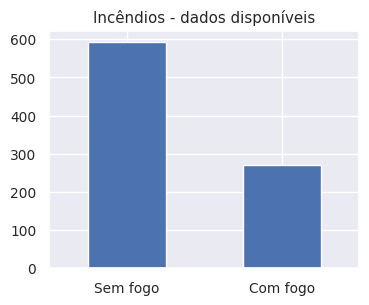

In [90]:
# Gráfico de barras com a distribuição da variável class1 usada como target

print((df['class1']).value_counts())

plt.figure(figsize=(4, 3))
fire_count = df['class1'].value_counts().plot.bar(title='Incêndios - dados disponíveis')
plt.subplots_adjust(top=0.9)
plt.xticks(rotation=360)
plt.show()

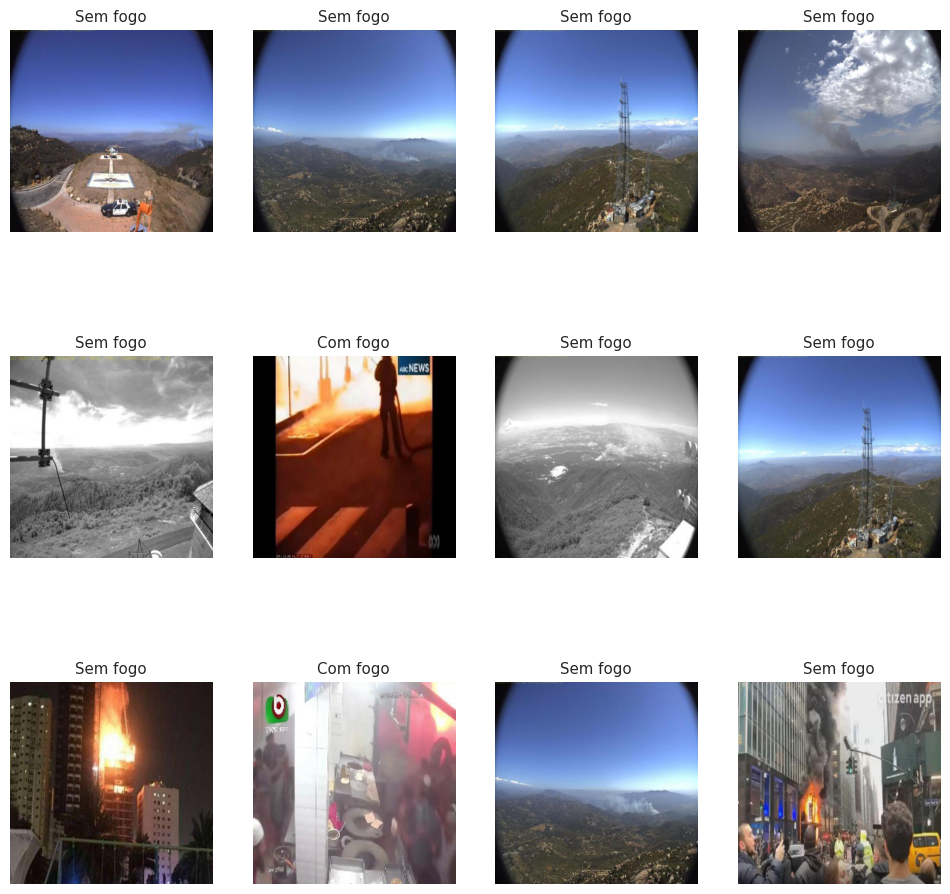

In [91]:
# Apreentando uma amostra de 12 imagens

fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path = r+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[:3])

    if sample[:3] == 'img':
      plt.title('Com fogo')
    elif sample[:3] != 'img':
      plt.title('Sem fogo')


plt.show()

Divisão dos dados em treino e teste: 30% das imagens para teste e 70% para treinamento do modelo de deep learning. Importante lembrar que os conjuntos devem ser disjuntos, ou seja, não devem poussir nenhum elemento em comum.

In [92]:
# Divisão dos dados entre treino e teste

train, test = train_test_split(df[['images' , 'class1']] ,test_size=0.3 ,random_state=42 , shuffle=True)

In [93]:
# Visualizando a divisão dos dados treino e teste

print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
                                                images    class1
850  img_438_jpg.rf.7c63d605fa4794d8fa2ce6c5e7756f4...  Com fogo
193  img_106_jpg.rf.0e5aec583bf1ee4e56a8e0ef146eaa5...  Sem fogo
280  ck0qdhfh1uks20848pclbrty6_jpeg_jpg.rf.258ae4a7...  Sem fogo
468  ck0u13xaxuv4k07010miwxisb_jpeg_jpg.rf.ad39e0ac...  Sem fogo
486  ck0t1zwemkseu08636i7fpksi_jpeg_jpg.rf.af596fa4...  Sem fogo
..                                                 ...       ...
106  ck0k99e6p79go0944lmxivkmv_jpeg_jpg.rf.f048b8d8...  Sem fogo
270  img_646_jpg.rf.1f666f053ca5b1c7c6bbb7fe08df29c...  Com fogo
860  ck0keprw9ke1d08483vmle7ed_jpeg_jpg.rf.7a4625db...  Sem fogo
435  ck0qbnoibg4ip0838na1tnqe8_jpeg_jpg.rf.a28231b9...  Sem fogo
102  ck0l939lbnftj0a46atyx4hh4_jpeg_jpg.rf.ef9cc98a...  Sem fogo

[604 rows x 2 columns]
##### Test: #####
                                                images    class1
198  img_449_jpg.rf.0fb72a6884a61dfdaa7622ad422f601...  Com fogo
720  img_388_jpg.rf.532a1d8de

##4.1 - Preparação dos dados

In [94]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                 rotation_range=40,
                                 shear_range=0.2,
                                 zoom_range=0.2,
                                 horizontal_flip=True,
                                 fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,r,
    target_size=(150,150),
    batch_size=100,
    class_mode='binary',
    x_col='images',
    y_col='class1',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,r,
    target_size=(150,150),
    batch_size=100,
    class_mode='binary',
    x_col='images',
    y_col='class1',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,r,
    target_size=(150,150),
    batch_size=100,
    class_mode='binary',
    x_col='images',
    y_col='class1',)

Found 484 validated image filenames belonging to 2 classes.
Found 120 validated image filenames belonging to 2 classes.
Found 260 validated image filenames belonging to 2 classes.


Found 1 validated image filenames belonging to 1 classes.


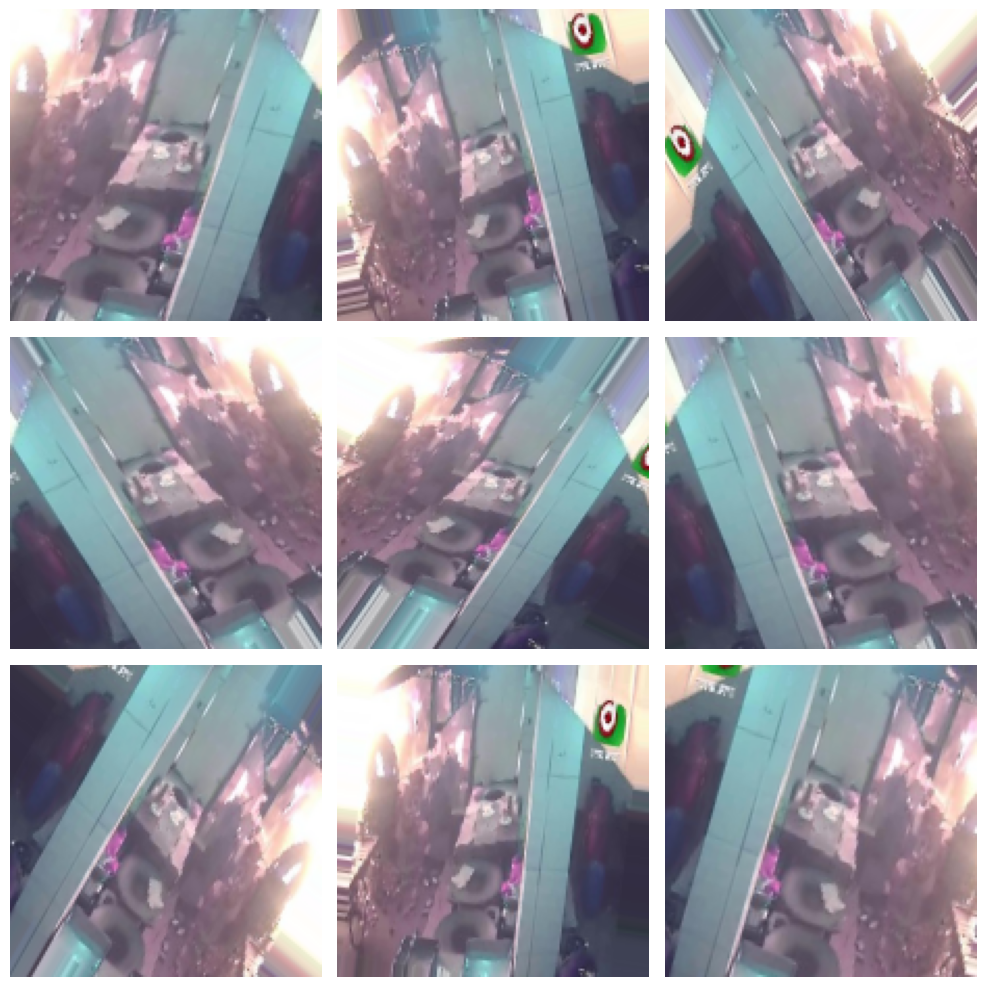

In [95]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    r,
    x_col='images',
    y_col='class1',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

# ***5. Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras***

##5.1 - Definição da arquitetura do modelo

In [96]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [97]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

In [98]:
# Resumo da arquitetura do modelo

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 17, 17, 128)     

# ***6. Treinamento do modelo de deep learning***

##6.1 - Compilação do modelo Keras com as configurações do treinamento

In [99]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

In [100]:
history=model.fit_generator(train_generator,
                            epochs=10,
                            validation_data=val_generator)

<ipython-input-100-72dcc57ba88c>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history=model.fit_generator(train_generator,


Epoch 1/10
5/5 [==============================] - 40s 8s/step - loss: 0.7292 - accuracy: 0.7500 - val_loss: 0.6093 - val_accuracy: 0.7667
Epoch 2/10
5/5 [==============================] - 39s 8s/step - loss: 0.5308 - accuracy: 0.7665 - val_loss: 0.4730 - val_accuracy: 0.8167
Epoch 3/10
5/5 [==============================] - 36s 7s/step - loss: 0.8099 - accuracy: 0.7128 - val_loss: 0.6843 - val_accuracy: 0.7417
Epoch 4/10
5/5 [==============================] - 39s 8s/step - loss: 0.5328 - accuracy: 0.7355 - val_loss: 0.5522 - val_accuracy: 0.7917
Epoch 5/10
5/5 [==============================] - 38s 8s/step - loss: 0.5491 - accuracy: 0.8099 - val_loss: 0.5394 - val_accuracy: 0.7750
Epoch 6/10
5/5 [==============================] - 37s 7s/step - loss: 0.4448 - accuracy: 0.8347 - val_loss: 0.3991 - val_accuracy: 0.8083
Epoch 7/10
5/5 [==============================] - 37s 7s/step - loss: 0.3068 - accuracy: 0.8740 - val_loss: 0.3542 - val_accuracy: 0.8250
Epoch 8/10
5/5 [==================

# ***7. Execução do modelo treinado em um subconjunto das imagems de teste***

4/4 [==============================] - 2s 534ms/step


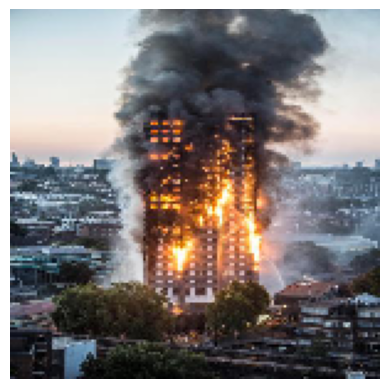

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.14746311


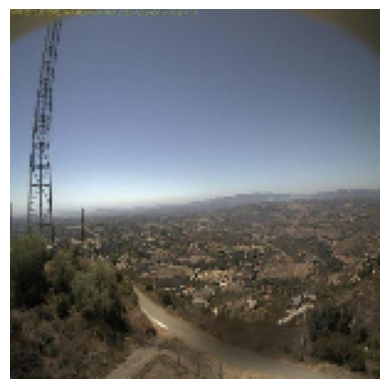

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9998871


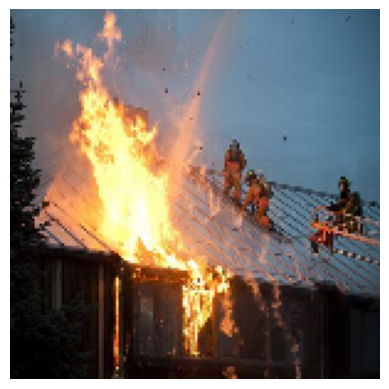

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.7636687


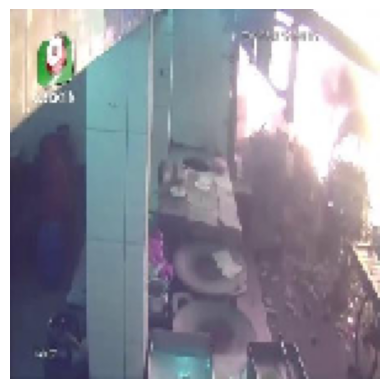

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.027793866


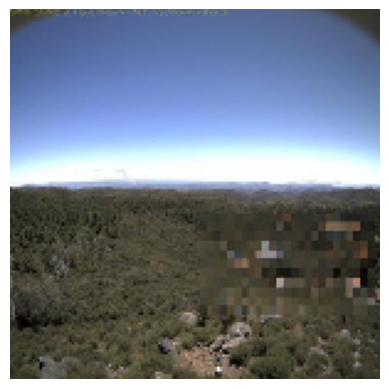

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9996314


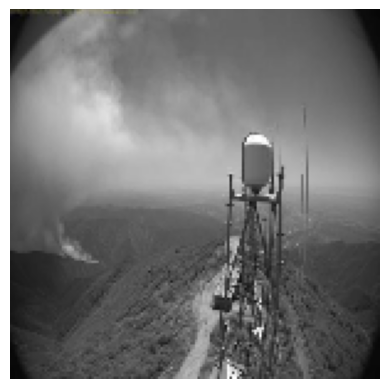

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99237496


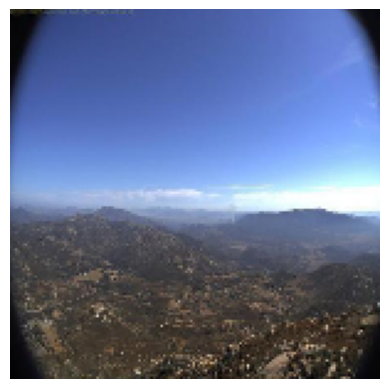

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9998484


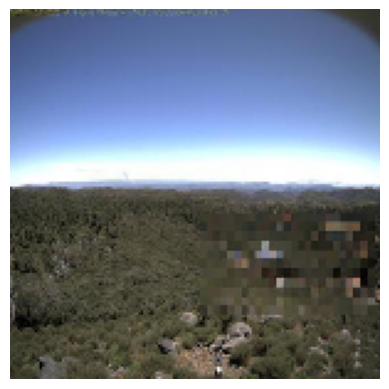

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99962145


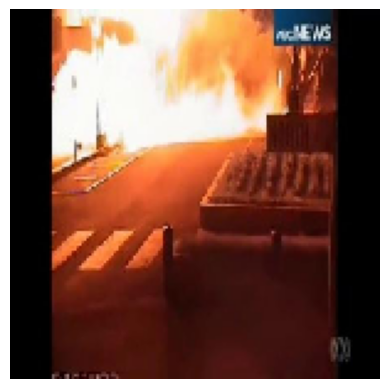

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.023287695


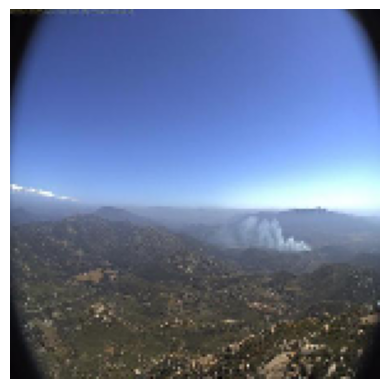

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9996851


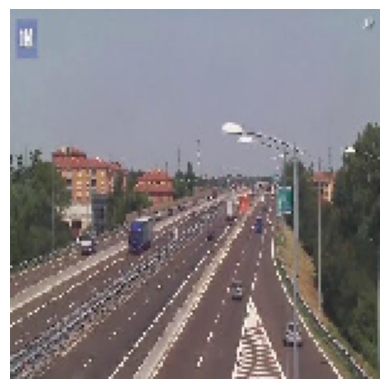

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.98432225


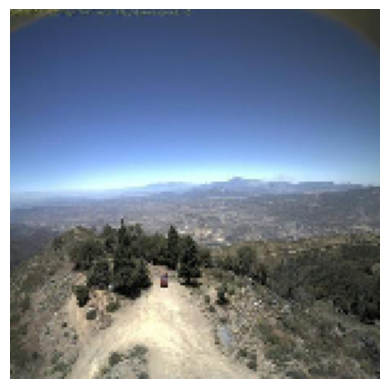

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999845


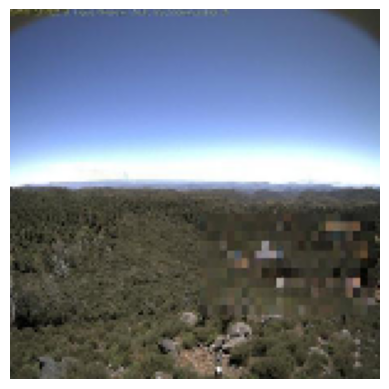

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9996275


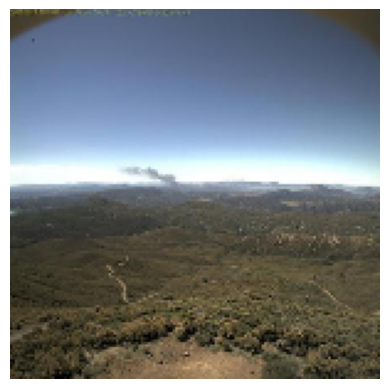

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99983305


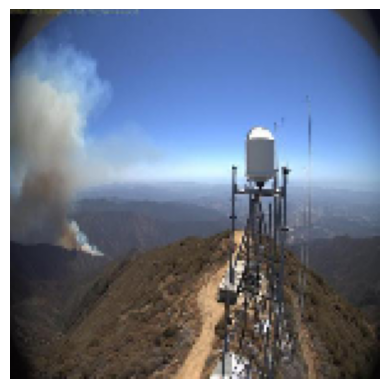

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9996288


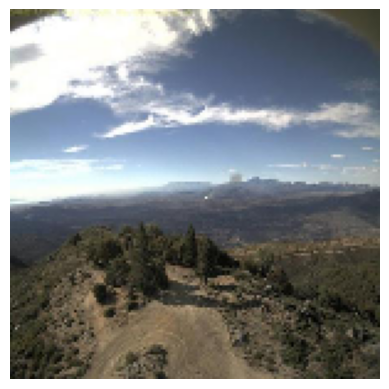

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99973595


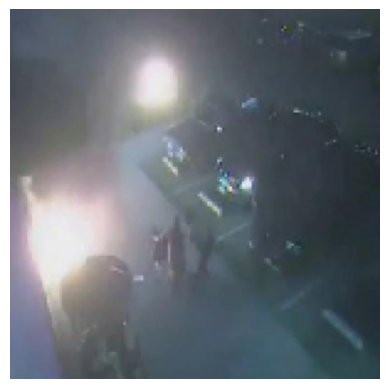

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.12089429


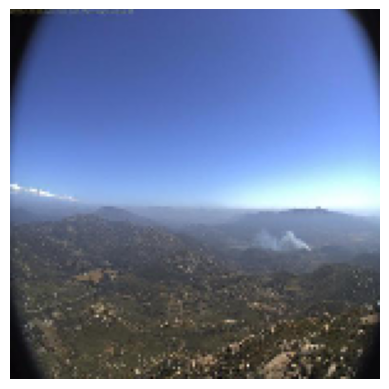

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9996915


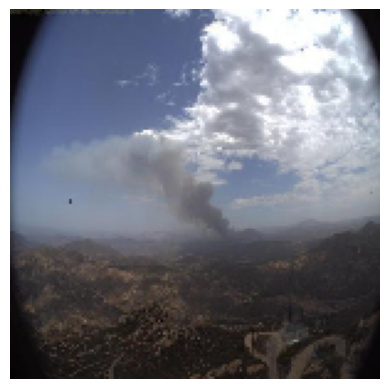

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9806559


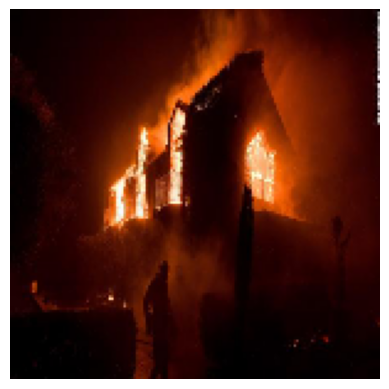

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.03101854


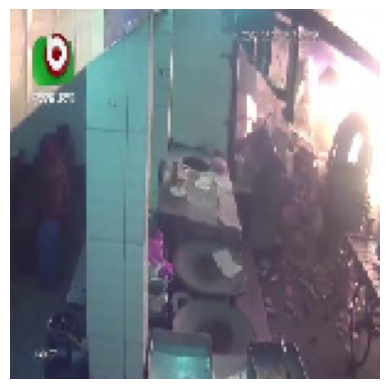

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.014347709


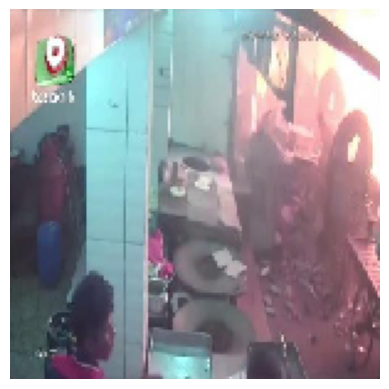

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.07758069


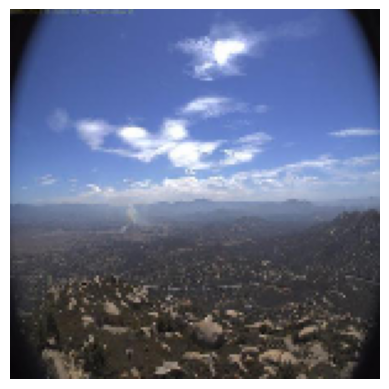

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9998822


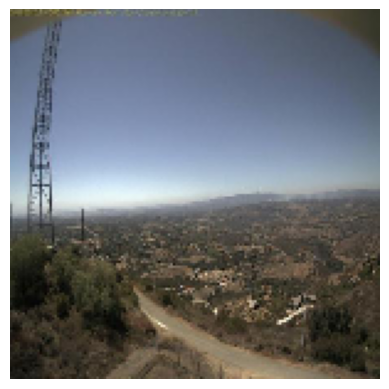

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999519


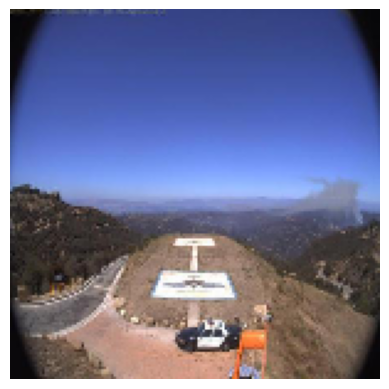

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99983704


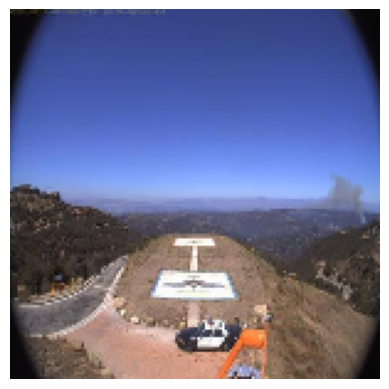

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99983424


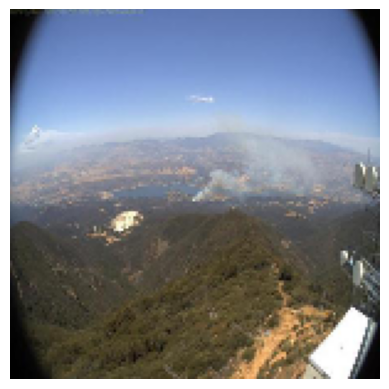

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99745655


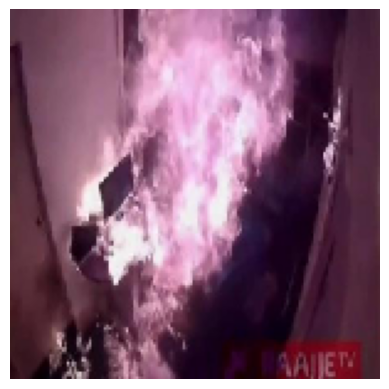

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.41970646


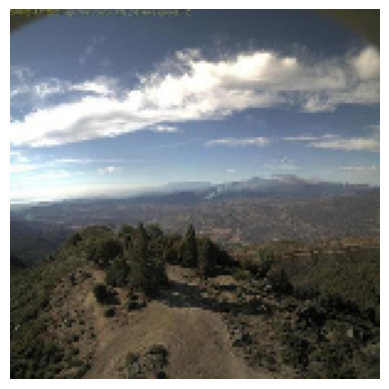

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9989018


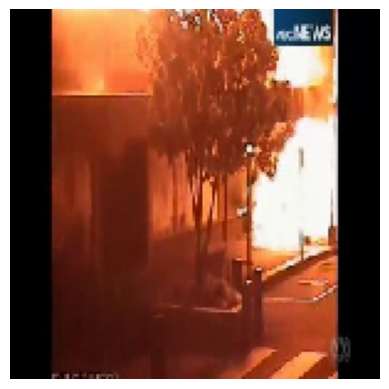

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.016217273


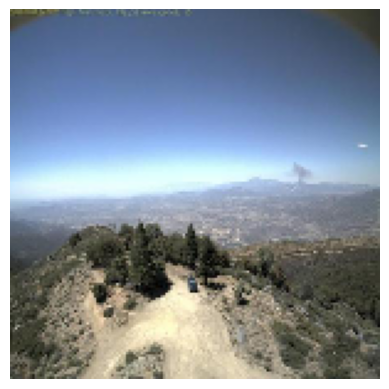

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999961


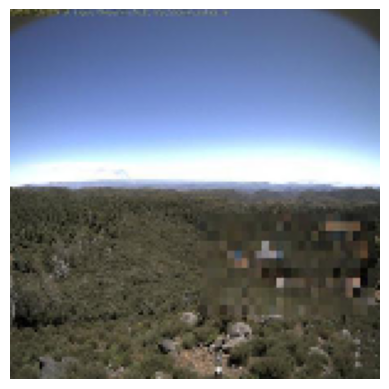

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9996517


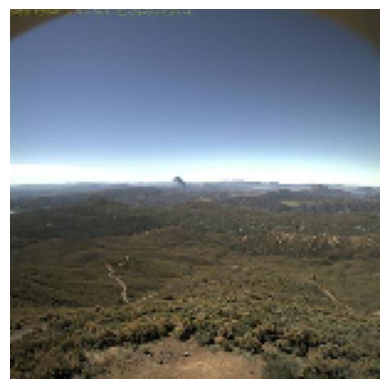

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9998313


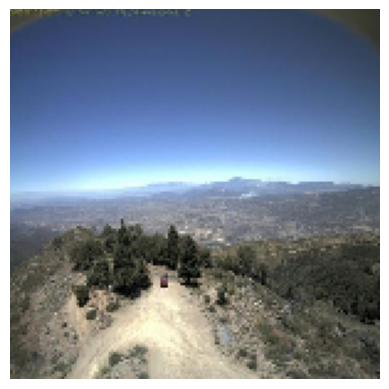

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999839


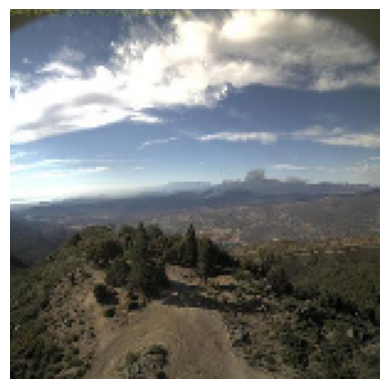

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9991505


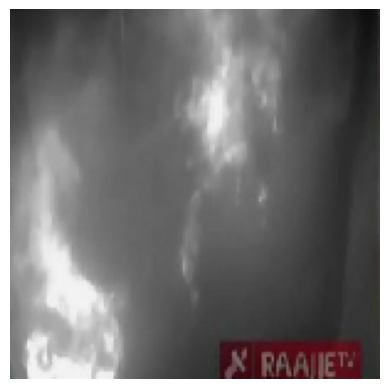

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.26385573


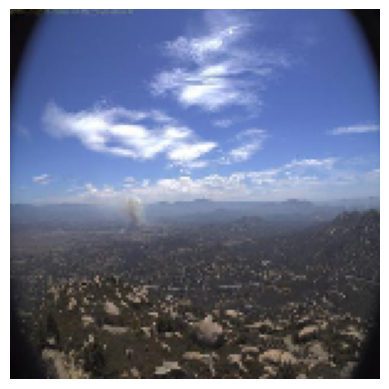

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99987006


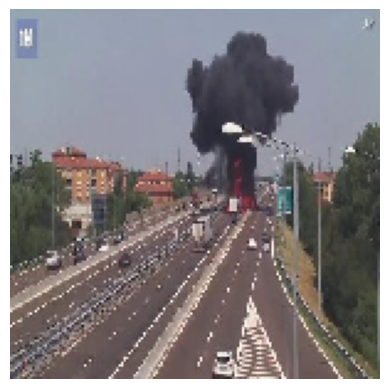

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.75630647


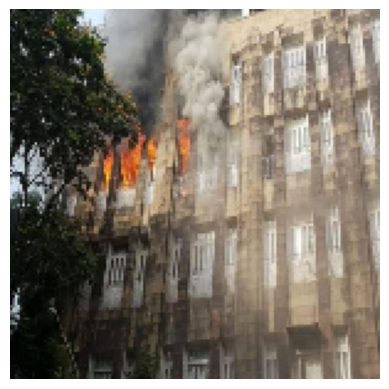

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.00934586


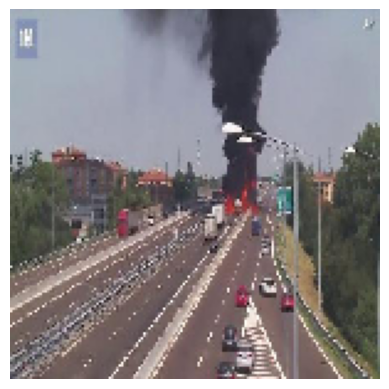

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.8684017


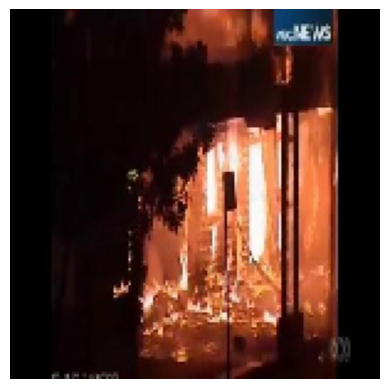

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.03636601


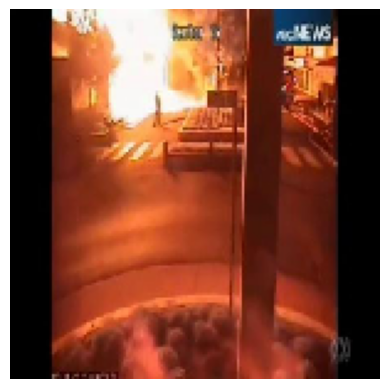

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.007567623


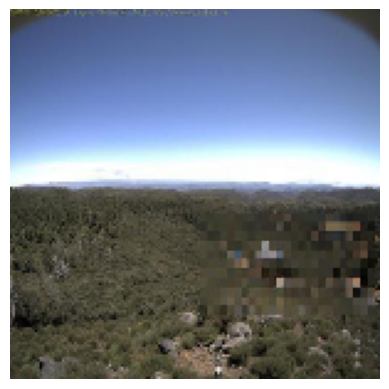

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9996591


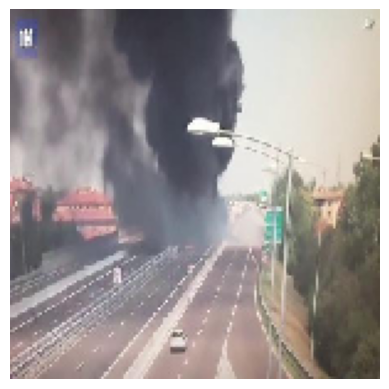

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.5959806


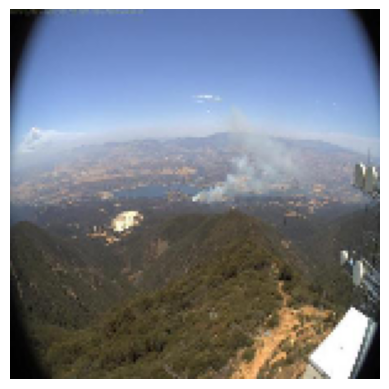

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9974804


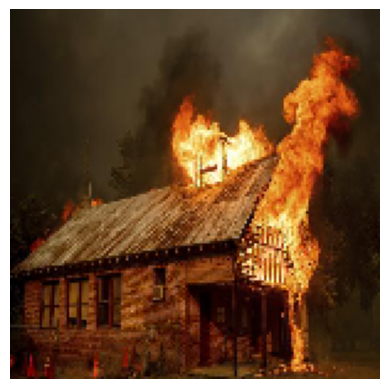

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.55657005


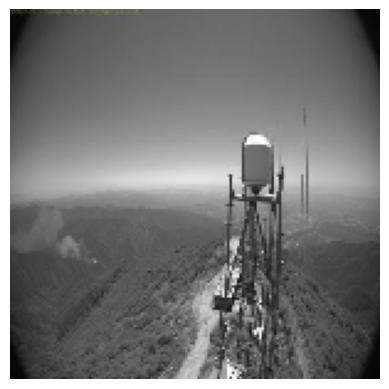

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99495924


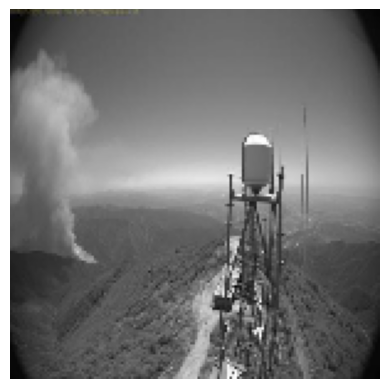

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99421316


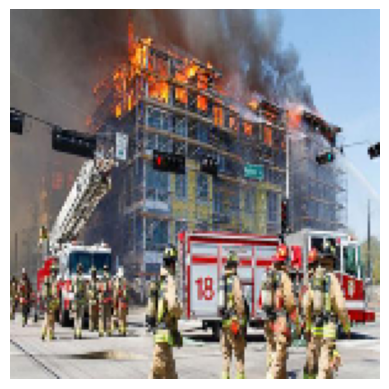

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.3362637


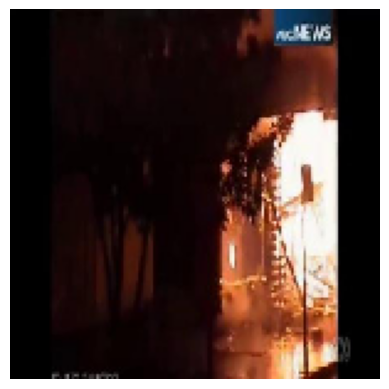

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.02750215


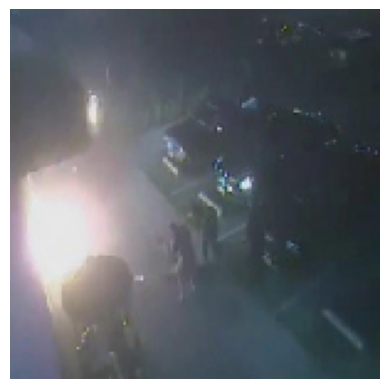

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.08154493


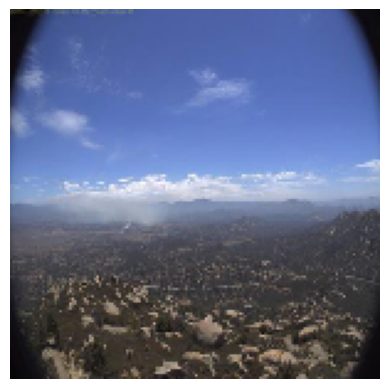

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999432


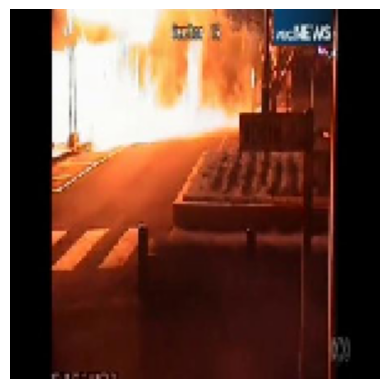

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.016567994


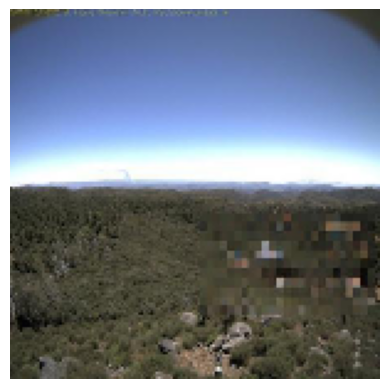

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99961036


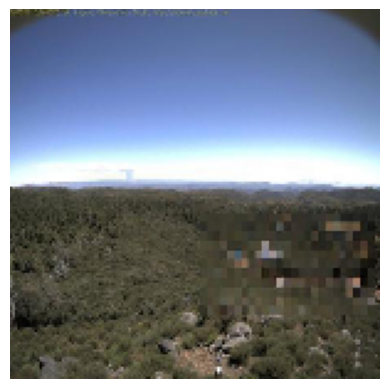

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9996305


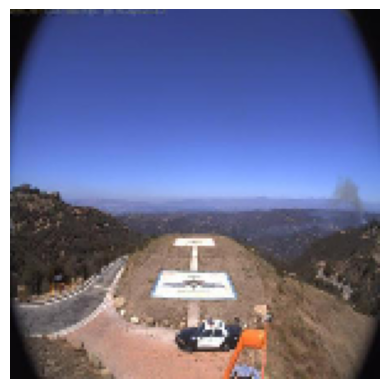

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9998326


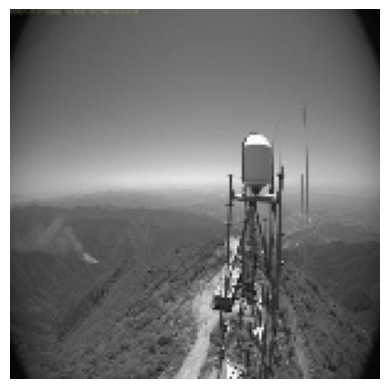

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99502945


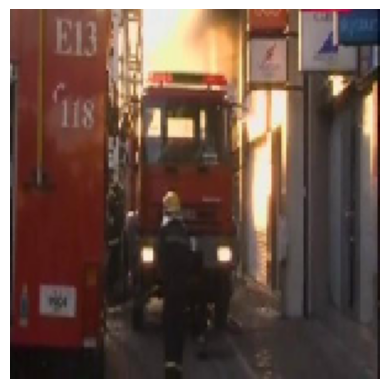

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.02477579


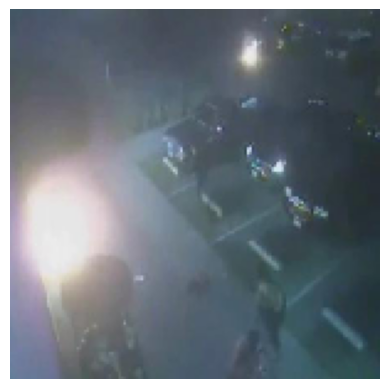

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.11400724


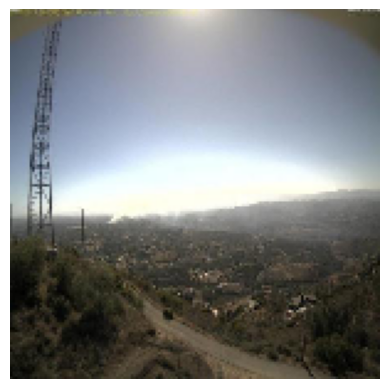

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99996585


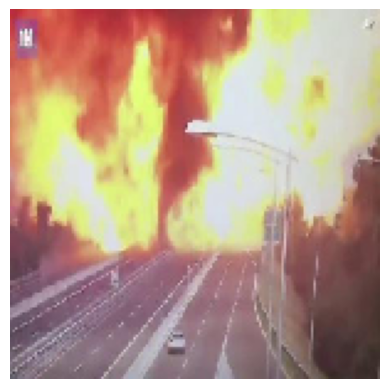

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.28371805


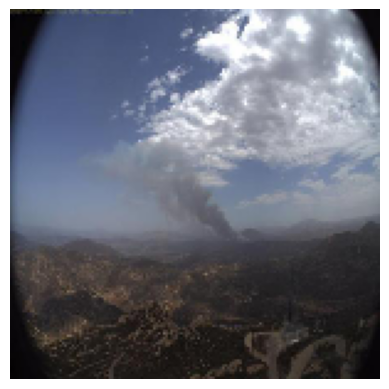

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9742661


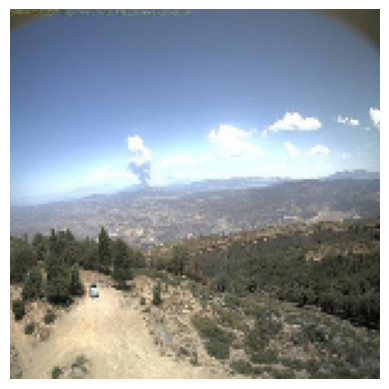

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999828


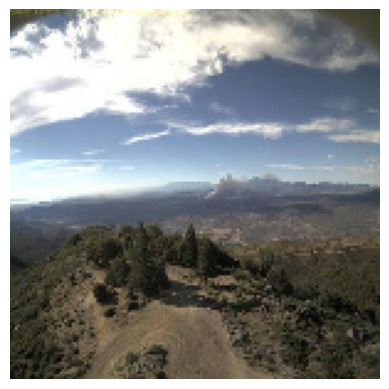

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99942285


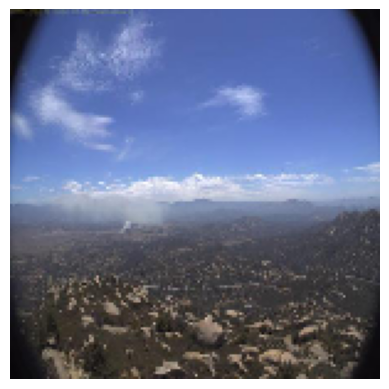

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9999346


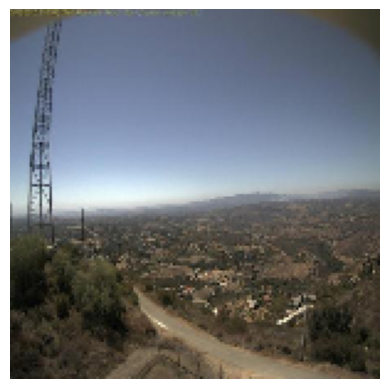

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99995327


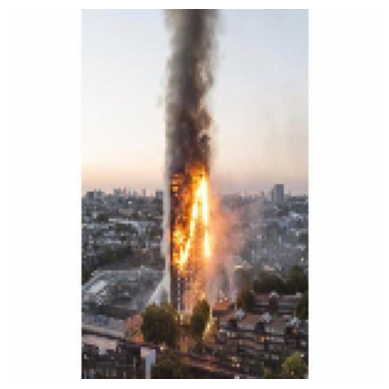

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9436718


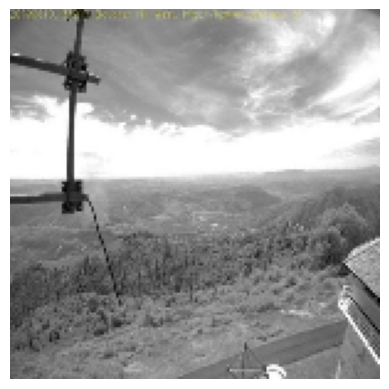

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.96526545


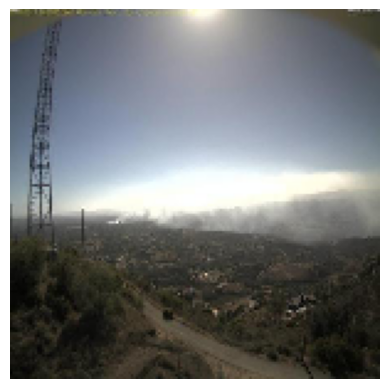

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9998973


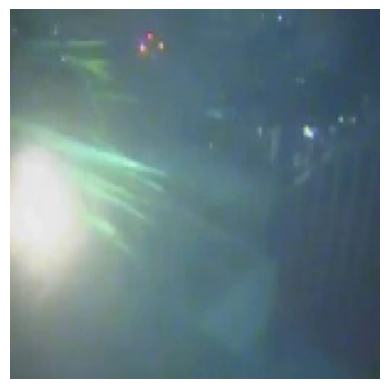

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.11841827


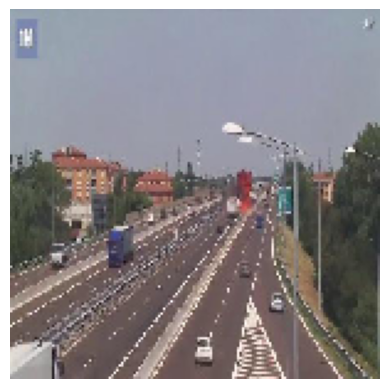

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.9850708


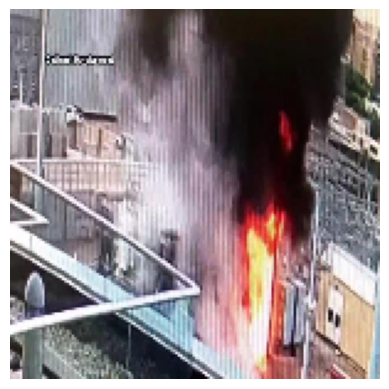

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.15060852


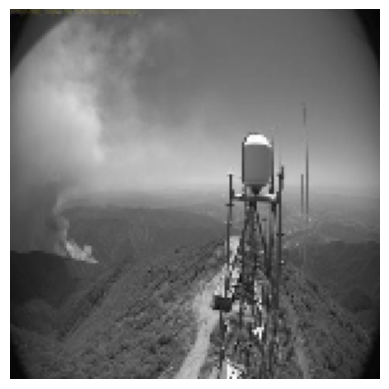

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9931508


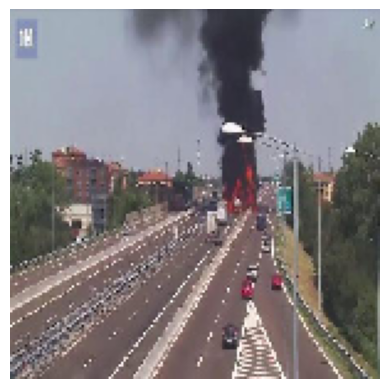

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.84856176


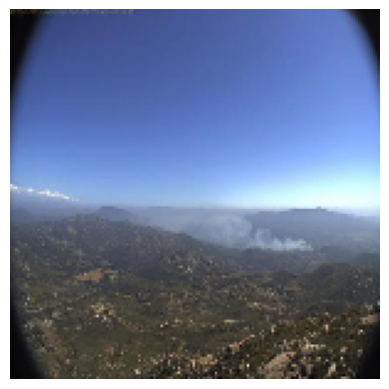

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99958295


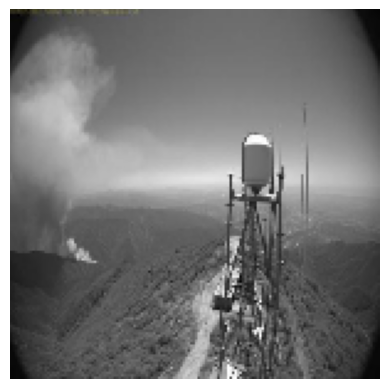

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99511725


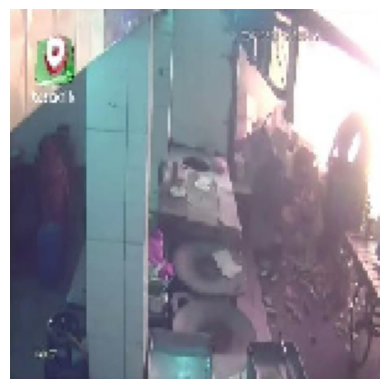

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.021445906


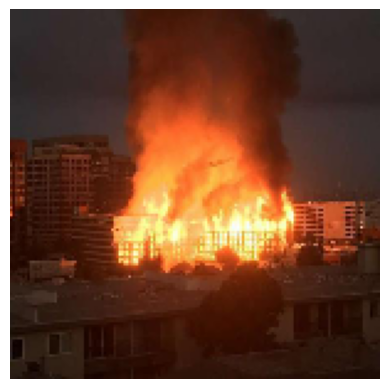

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.28755412


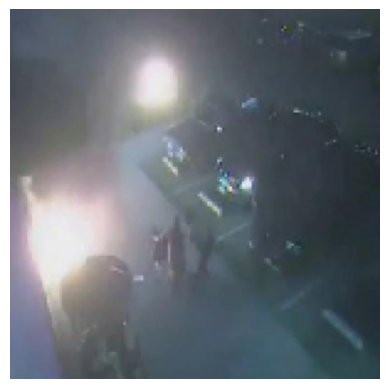

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.12089429


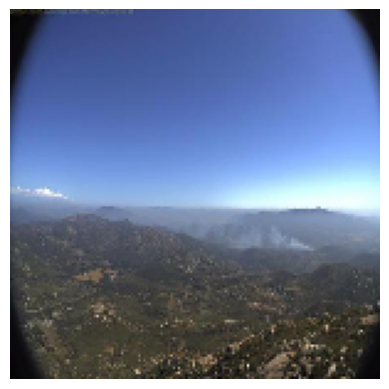

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.9995754


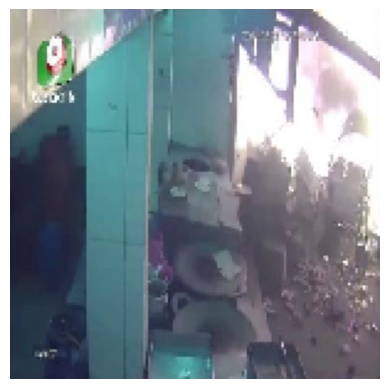

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.024498684


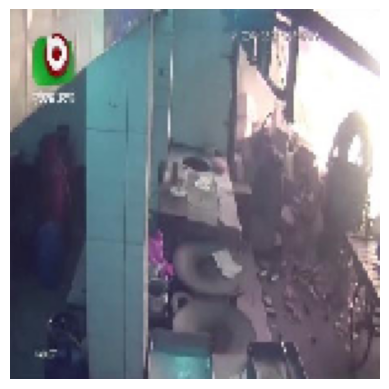

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.009913683


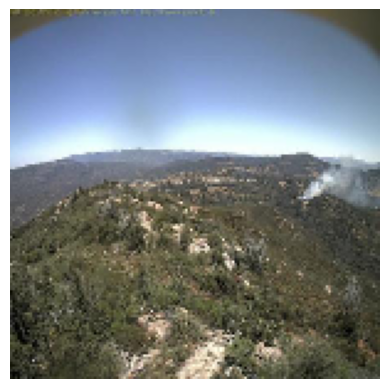

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.99262536


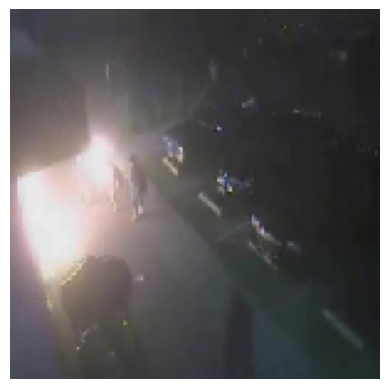

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.14591736


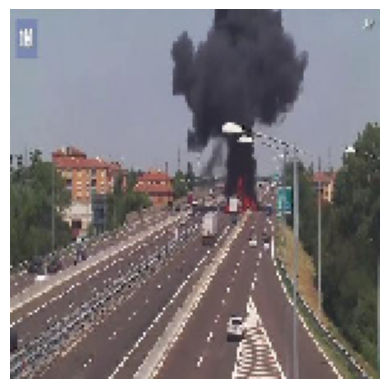

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.79711664


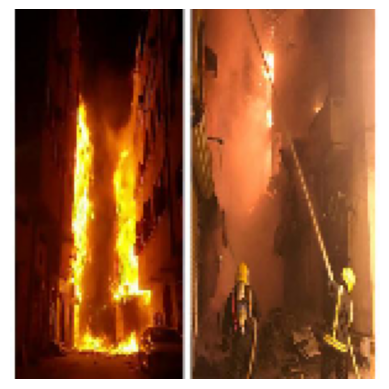

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.056958728


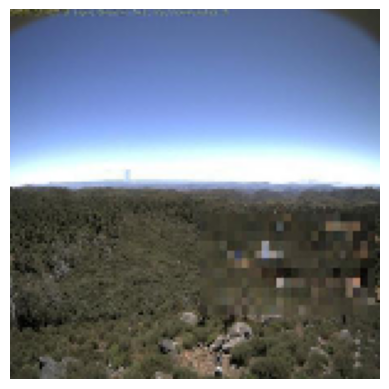

In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['Com fogo', 'Sem fogo']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'Sem fogo' if prediction >= 0.5 else 'Com fogo'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

In [ ]:
# livro jornada python pag 493
plt.xlabel('Época')
plt.ylabel('Acurácia')
plt.plot(history.history['accuracy'], '--')
plt.plot(history.history['val_accuracy'])
plt.title("Evolução da acurácia por épocas")
plt.legend(['Treino', 'Validação'])
plt.show();

In [ ]:
# livro jornada python pag 493
plt.xlabel('Época')
plt.ylabel('Perda')
plt.plot(history.history['loss'], '--')
plt.plot(history.history['val_loss'])
plt.title("Evolução da perda por épocas")
plt.legend(['Treino', 'Validação'])
plt.show();

# ***8. Avaliação do modelo de deep learning***

In [ ]:
loss, accuracy = model.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

In [ ]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

In [ ]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['Com fogo',
                               'Sem fogo'],
                      normalize= False,
                      title='Matriz real x predição')

# ***9. Exportação do modelo de deep learning para posterior uso***

In [ ]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'datasets/dogs_vs_cats/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

# ***10. Teste do modelo exportado***

In [ ]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['Com fogo', 'Sem fogo']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'Sem fogo' if prediction >= 0.5 else 'Com fogo'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)